# **🏨Bangkok Airbnb Pricing Framework and Market Insights**

The project aims to analyze 15000+ active **Airbnb listings in Bangkok** from 2012 to 2022 to develop a data-driven pricing framework for Airbnb hosts in Bangkok by analyzing key market dynamics that influence listing prices.

## Business Questions
1. **Pricing**: How does price listing vary based on different factors such as neighborhoods, room types, seasons, and year-round availability?
2. **Availability**: What proportion of listings are available year-round vs. seasonally?
3. **Host characteristics**: Are professional hosts more active in certain price segments or areas? Do they set higher or lower prices?
4. **Market segmentation**: How are the different price segments geographically located in Bangkok?
5. **Actionable insights**: Based on these data, how can hosts optimize their pricing?

## Objectives

1. Understand the Bangkok Airbnb market structure: pricing ranges, popular room types, and host activity.
2. Identify key factors that influence price, demand, and availability.
3. Deliver actionable findings through data visualization and descriptive analysis.

## Case Study
### Stakeholders
1. Individual Airbnb Hosts, we can deliver revenue increase through price optimization.
2. Airbnb Strategy team: Bangkok market insight can be used to optimize pricing suggestions and improve customer-facing operations.

### Positioning
I will be positioning myself as a Pricing/Revenue Analyst conducting market study for Bangkok's Airbnb ecosystem.

## Data Dictionary
Listing data only consists of Active listings from 2012 to 2022.

| feature | description | 
|---|---|
| id | Listing unique ID. |
| name | Listing name. |
| host_id | Host unique ID. |
| host_name | Host name. |
| neighborhood | Listing neighborhood location. |
| latitude | Geographic coordinate. |
| longitude | Geographic coordinate. |
| room_type | Entire home/apt, Hotel room, Private room, Shared room. |
| price | Daily renting price in THB. |
| minimum_nights | Minimum number of nights to rent of the listing. |
| number_of_reviews | Amount of reviews the listing has. |
| last_review | Date of the latest review. |
| calculated_host_listings_count | Amount of listing this specific host has. |
| availability_365 | How many days the listing is available in a year. |
| number_of_reviews_ltm | Amount of reviews the listing has in the last 12 months. |


## Step 1: Data Cleaning

### Import data and libraries

In [1]:
#DATA SCIENCE, WRANGLING, AND VISUALIZATION LIBRARIES
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
import folium

#REGEX AND UNICODE FOR TEXT DECODING
import re
import unicodedata

In [2]:
#IMPORT AIRBNB DATA
file_path = r"C:\Users\mariq\Documents\2. KERJA\Purwadika\Module 2\Capstone 2\Airbnb Listings Bangkok.csv"
df = pd.read_csv(file_path)

#DROP THE NUMBER COLUMN
df.drop(columns=['Unnamed: 0'], inplace=True)

#SHOW FIRST 5 ROWS
df.head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,27934.0,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,1/6/2020,0.50,2,353,0
1,27979.0,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,NaN,NaN,2,358,0
2,28745.0,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,NaN,NaN,1,365,0
3,35780.0,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,4/1/2022,0.03,1,323,1
4,941865.0,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,NaN,NaN,3,365,0


## Initial Data Cleaning
- Checking for general duplicates, nulls/missing values, and mismatched data types.
- Missing values can be cross referenced using "id" or "host_id" if available.
- Plot "Missing not at random" using heatmap
- Drop as little as possible, then show amount and percentage of rows dropped.

### Handling Duplicates

In [3]:
#CHECK DUPLICATE ROWS
print("Duplicate rows:", df.duplicated().sum()) # No duplicate rows found

#DROP DUPLICATES (IF ANY)
df = df.drop_duplicates()

Duplicate rows: 0


### Handling Missing Values

In [4]:
#CHECK MISSING VALUES
df.isnull().sum()

id                                   0
name                                 8
host_id                              0
host_name                            1
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       5790
reviews_per_month                 5790
calculated_host_listings_count       0
availability_365                     0
number_of_reviews_ltm                0
dtype: int64

Missing values found:
- 8 rows on "name"
- 1 rows on "host_name"

Both columns have no common id's, so they can't be cross-referenced or fixed. Since its a very small amount, we will drop them.

Ideally missing name data could be fixed by cross-referencing them using other listing under the same id.

In [5]:
#DEAL WITH MISSING VALUES ON "host_name" and "name"
df[df["host_name"].isnull()] # No other listing under the same host_id, so we will drop.
df[df["name"].isnull()] # Can't cross reference, will drop.

df = df.dropna(subset=['name', 'host_name'])

#CHANGE "last_review" TO DATETIME FORMAT
df["last_review"] = pd.to_datetime(df["last_review"])

#CHECK DATA TYPES AND DUPLICATES
df.dtypes
df.isna().sum()

id                                   0
name                                 0
host_id                              0
host_name                            0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       5784
reviews_per_month                 5784
calculated_host_listings_count       0
availability_365                     0
number_of_reviews_ltm                0
dtype: int64

### Handling NaN values on "reviews_per_month"
Visually inspecting the data, we can see that listings that have 0 number_of_reviews will have NaN reviews_per_month. This can cause an error. We will be filling NaN values with 0.

In [6]:
df["reviews_per_month"].isna().sum()

#FILL NAN VALLUE WITH 0
df["reviews_per_month"] = df["reviews_per_month"].fillna(0)

df.isna().sum()

id                                   0
name                                 0
host_id                              0
host_name                            0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       5784
reviews_per_month                    0
calculated_host_listings_count       0
availability_365                     0
number_of_reviews_ltm                0
dtype: int64

last_review NaT values hold meaning, so it is beneficial to leave it at NaT. If we need to use the column for visualization later, we can use .notna() to filter out the NaT values.

### Handling "number_of_reviews_ltm"
"number_of_reviews_ltm" can have invalid values if:
- last_review is NOT last year but number_of_reviews_ltm > 0
- last_review NaT but number_of_review_ltm > 0

In [7]:
cutoff_date = pd.to_datetime("2022-12-29") - pd.DateOffset(years=1) #29 December 2022 chosen because the latest/final last_review is at 28 December 2022.

#FLAG CONDITION
df["invalid_reviews_ltm"] = ((df["last_review"].notna()) & (df["last_review"] < cutoff_date) & (df["number_of_reviews_ltm"] > 0)) | (df["last_review"].isna() & (df["number_of_reviews_ltm"] > 0))

#SEE INCONSISTENT DATA
print("Inconsistent rows:", df["invalid_reviews_ltm"].sum())
df[df["invalid_reviews_ltm"] == True]

Inconsistent rows: 1


,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,invalid_reviews_ltm
7034,32346412.0,Room 6th| Butler Service| ON NUT BTS| |Wifi Condo,158654054,Erica,Khlong Toei,13.70299,100.59299,Entire home/apt,1000,30,8,2021-12-28,0.17,27,82,1,True


In [8]:
#DROP INCONSISTENT ROW
df = df[df["invalid_reviews_ltm"] == False]

#DROP "invalid_reviews_ltm" COLUMN
df = df.drop(columns=["invalid_reviews_ltm"])

df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15844 entries, 0 to 15853
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              15844 non-null  float64       
 1   name                            15844 non-null  object        
 2   host_id                         15844 non-null  int64         
 3   host_name                       15844 non-null  object        
 4   neighbourhood                   15844 non-null  object        
 5   latitude                        15844 non-null  float64       
 6   longitude                       15844 non-null  float64       
 7   room_type                       15844 non-null  object        
 8   price                           15844 non-null  int64         
 9   minimum_nights                  15844 non-null  int64         
 10  number_of_reviews               15844 non-null  int64         
 11  last_re

## Text Encoding Issue
Most likely due to unique thai characters, columns "name" and "host_name" contain mojibake characters caused by wrong encoding. Decoded using a text-cleaning pipeline combining regular expression–based detection and Unicode normalization.

### Helper Functions

In [9]:
def contains_thai(s): # To avoid decoding Thai character (Unicode U+0E00–U+0E7F)
    if pd.isna(s): # If empty, return False                 
        return False
    if not isinstance(s, str): # If not a string type, return False
        return False
    
    for ch in s: # Loop for each character
        if '\u0E00' <= ch <= '\u0E7F': #If it
            return True
    return False # <--- Q: knp ga pake else ya terus return falsenya disini

def like_mojibake(s): #Look for characters from error/wrong decoding
    if pd.isna(s) or not isinstance(s, str):
        return False
    # simple regex for common artifacts — conservative so we don't "fix" normal text
    return bool(re.search(r'[ÃÂàâ¢\ufffd]', s))

### Decoder Function

In [10]:
def fix_mojibake(s):
    if pd.isna(s): # If s is empty, return s.
        return s
    if not isinstance(s, str): # If its not str, return s
        return s
    if contains_thai(s): # If contains Thai character, assume it's fine
        return s
    if not like_mojibake(s): # If its not mojibake, return s.
        return s

    for enc_from in ('latin1', 'cp1252'):  # Try from encodings that commonly cause this mojibake
        try:
            candidate = s.encode(enc_from).decode('utf-8')
        except Exception:
            continue
        if contains_thai(candidate):
            return candidate

    # If nothing worked, return original
    return s

In [11]:
def normalize_text(s):
    if pd.isna(s):
        return s
    if not isinstance(s, str):
        s = str(s)
    # Normalize unicode (NFKC) to unify characters (e.g., combining marks)
    s = unicodedata.normalize('NFKC', s)
    # Replace newlines/tabs with single space
    s = re.sub(r'[\r\n\t]+', ' ', s)
    # Collapse multiple spaces into one
    s = re.sub(r'\s+', ' ', s)
    # Trim edges
    return s.strip()

### Apply Functions

In [12]:
df['name'] = df['name'].apply(fix_mojibake).apply(normalize_text)
df['host_name'] = df['host_name'].apply(fix_mojibake).apply(normalize_text)

df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15844 entries, 0 to 15853
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              15844 non-null  float64       
 1   name                            15844 non-null  object        
 2   host_id                         15844 non-null  int64         
 3   host_name                       15844 non-null  object        
 4   neighbourhood                   15844 non-null  object        
 5   latitude                        15844 non-null  float64       
 6   longitude                       15844 non-null  float64       
 7   room_type                       15844 non-null  object        
 8   price                           15844 non-null  int64         
 9   minimum_nights                  15844 non-null  int64         
 10  number_of_reviews               15844 non-null  int64         
 11  last_re

### Manual Validation

In [13]:
#CROSS-REFERENCE 10 ID'S ON ROWS WITH MOJIBAKE ON EXCEL
test_id = [1823321, 973830, 1862331, 1133843, 1547429, 3639111, 4928854, 5714918, 7463404, 10008160, 52940323]

mojibake_valid = df[df["id"].isin(test_id)]

mojibake_valid

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
29,973830.0,BangLuang House1 @ Bangkok Thailand,5325919,วสวัตติ์,Bangkok Yai,13.732920,100.464130,Private room,2078,1,76,2019-12-31,0.64,3,350,0
31,1823321.0,กรองทองแมนชั่น (ลาดพร้าว 81),9545111,Penjit,Wang Thonglang,13.789380,100.613400,Private room,600,1,0,NaT,0.00,1,365,0
46,1862331.0,☞✪✪✪✪Roomy Studio 4 Family r friends✪No Stairs...,8214044,Evan From Sanctuary House,Sathon,13.720730,100.546900,Entire home/apt,1450,1,268,2022-12-15,2.59,8,350,7
88,1133843.0,เฮ้าส์โหมด House Mode,6220137,Prapussorn,Thon Buri,13.726463,100.491293,Private room,800,1,0,NaT,0.00,1,365,0
275,1547429.0,บ้านใกล้สุวรรณภูมิ ตรงข้ามแอร์พอร์ตลิ้งบ้านทับ...,8243802,Prare,Saphan Sung,13.736670,100.691410,Entire home/apt,10355,1,0,NaT,0.00,1,365,0
319,3639111.0,French Vintage Around the World B&B 中文服務 華語溝通,15039858,Around The World B&B,Suan Luang,13.737490,100.632790,Private room,8000,1,14,2018-07-04,0.15,10,365,0
548,4928854.0,❉❉The Perfect Quiet Oasis in BKK Center Near M...,1927968,Evan,Sathon,13.720700,100.547120,Entire home/apt,750,1,113,2022-11-02,1.17,37,328,8
770,5714918.0,PERFECT CONDO in CBD serve up to 6 (完美的公寓),29628725,Ben,Khlong San,13.721850,100.502660,Entire home/apt,3082,30,47,2020-01-08,0.59,1,256,0
1036,7463404.0,Komfort Place+,24024629,ป๊อป,Yan Nawa,13.703480,100.534590,Private room,850,1,2,2016-02-27,0.02,3,331,0
1284,10008160.0,舒适空调全下铺7人间(中文服务)曼谷树青旅TreeHostel,49419222,Lee,Din Daeng,13.764160,100.563550,Shared room,363,1,0,NaT,0.00,5,365,0


All special and thai/chinese characters show. **Decoding successful**.

### Handling Listings Outside of Bangkok
Filtered using bangkok area boundary coordinate on google earth.

In [14]:
#SET CENTER OF MAP FOR BETTER VISUALIZATION
center_lat = df["latitude"].mean()
center_lon = df["longitude"].mean()

print(f"Center of the map is at {center_lat}, {center_lon}")

Center of the map is at 13.745150306313432, 100.5598924761424


In [15]:
#PLOT INTO MAP USING FOLIUM
m = folium.Map(location=[center_lat, center_lon], zoom_start=12, tiles="cartodbpositron")

from folium.plugins import MarkerCluster

marker_cluster = MarkerCluster().add_to(m)

for i, row in df.iterrows():
    folium.Marker(
        location=[row["latitude"], row["longitude"]],
        popup=f"Price: {row['price']} THB\nRoom type: {row['room_type']}",
    ).add_to(marker_cluster)

#SHOW MAP
m

In [16]:
bangkok_bounds = (df['latitude'].between(13.5, 14.2)) & (df['longitude'].between(100.3, 100.95)) #Based on google search
outside_bangkok = df[~bangkok_bounds]

print(f"Listings outside Bangkok: {len(outside_bangkok)}")

Listings outside Bangkok: 0


No listings are outside of bangkok. **No rows dropped**.

### Validating "calculated_host_listings_count"
Check if the column is accurate with actual "host_id" listing amount.

In [17]:
#CALCULATE ACTUAL HOST LISTING COUNTS USING "host_id"
actual_host_counts = df["host_id"].value_counts()

actual_host_counts

host_id
201677068    228
52161947      99
26736483      89
68154488      62
228535635     62
            ... 
168475163      1
492470428      1
75210832       1
52060777       1
187224858      1
Name: count, Length: 6651, dtype: int64

In [18]:
#COMPARE WITH DATA PROVIDED COUNTS
host_validation = (df.groupby("host_id")[["calculated_host_listings_count"]].first().assign(actual_host_listings_count=actual_host_counts))

#CHECK DIFFERENCE
host_validation["diff"] = (host_validation["calculated_host_listings_count"] - host_validation["actual_host_listings_count"])
print(host_validation["diff"].value_counts())

diff
0    6649
1       2
Name: count, dtype: int64


**2 hosts** found with difference = 1.

In [19]:
mismatch_hosts = host_validation[host_validation["diff"] != 0].index

#DISPLAY ROWS IN DF WITH THOSE "host_id"
df[df["host_id"].isin(mismatch_hosts)]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
1981,13400326.0,Errday Guest House,73275200,Pakaphol,Khlong Toei,13.72427,100.56443,Private room,950,1,1,2020-02-19,0.03,3,1,0
1982,13400758.0,Errday Guest House,73275200,Pakaphol,Khlong Toei,13.72373,100.56415,Private room,36363,1,0,NaT,0.00,3,1,0
6850,32053335.0,Room 18th| ON NUT BTS|Wifi Condo,158654054,Erica,Khlong Toei,13.70467,100.59178,Entire home/apt,786,30,5,2022-01-02,0.11,27,330,1
6875,31837199.0,Room 15th| ON NUT BTS|Wifi Condo,158654054,Erica,Khlong Toei,13.70338,100.59243,Entire home/apt,786,30,6,2022-07-08,0.13,27,355,1
7032,32345902.0,Room 24th | ON NUT BTS| WiFi Condo,158654054,Erica,Khlong Toei,13.70317,100.59184,Entire home/apt,809,30,9,2021-08-25,0.19,27,82,0
7033,32346214.0,Room 27th | ON NUT BTS|Wifi Condo,158654054,Erica,Khlong Toei,13.70512,100.59485,Entire home/apt,875,28,15,2022-10-10,0.32,27,22,2
7035,32346516.0,Room 8th | ON NUT BTS| Wifi Condo,158654054,Erica,Khlong Toei,13.70381,100.59370,Entire home/apt,750,26,8,2021-11-30,0.17,27,44,0
7198,32730226.0,Room 3th| ON NUT BTS| Wifi Condo,158654054,Erica,Khlong Toei,13.70388,100.59530,Entire home/apt,875,30,15,2022-09-27,0.32,27,83,4
7199,32730743.0,Room 16th| ON NUT BTS| Wifi Condo,158654054,Erica,Khlong Toei,13.71470,100.59057,Entire home/apt,776,30,9,2022-11-11,0.19,27,65,2
7200,32731213.0,Room26th| ON NUT BTS| Wifi Condo,158654054,Erica,Khlong Toei,13.70538,100.59310,Entire home/apt,777,30,22,2022-11-01,0.48,27,60,1


- **host_id 73275200** has 2 actual listings but its calculated value is 3.
- **host_id 158654054**	has 26 actual listings but its calculated value is 27.

We will fix and replace the wrong valules with the correct amount.

In [20]:
df.loc[df["host_id"] == 73275200, "calculated_host_listings_count"] = 2
df.loc[df["host_id"] == 158654054, "calculated_host_listings_count"] = 26

In [21]:
#COMPARE WITH DATA PROVIDED COUNTS
host_validation = (df.groupby("host_id")[["calculated_host_listings_count"]].first().assign(actual_host_listings_count=actual_host_counts))

#CHECK DIFFERENCE
host_validation["diff"] = (host_validation["calculated_host_listings_count"] - host_validation["actual_host_listings_count"])
print(host_validation["diff"].value_counts())

diff
0    6651
Name: count, dtype: int64


Invalid "calculated_host_listings_count" values **fixed.**

## Descriptive Statistics for "price"

### General Cleaning

In [22]:
#DROP PRICES THAT ARE ZERO (IF ANY)
price_0 = df[df["price"] == 0]
print(f"Amount of data with price = 0 is: {len(price_0)}")

df = df[df["price"] != 0]
print(f"{len(price_0)} data has been dropped")

Amount of data with price = 0 is: 1
1 data has been dropped


Amount of data with price = 0 is only 1, so we will just remove it.

In [23]:
#MIN, MAX, RANGE
price_max = df["price"].max()
price_min = df["price"].min()
price_range = price_max - price_min

print(f"Minimum price: {price_min} Baht")
print(f"Maximum price: {price_max} Baht")
print()

#MEAN, MEDIAN, STD
price_mean = df["price"].mean()
price_median = df["price"].median()
price_std = df["price"].std()

print(f"Mean price: {price_mean} Baht")
print(f"Median price: {price_median} Baht")
print()

#NORMALITY, SKEWNESS, ETC
price_skew = df["price"].skew()
price_kurt = df["price"].kurt()
statDP, p_valueDP = stats.normaltest(df["price"])

print("Skewness:", price_skew) #If positive, right skewed
print("Kurtosis:", price_kurt) #If > 3, means very sharp peak
print("p-value D'Agostino Pearson:", p_valueDP)
print()

#QUARTILE VALUES, LOWER/UPPER BOUND
price_q1 = df["price"].quantile(0.25)
price_q2 = df["price"].quantile(0.50)
price_q3 = df["price"].quantile(0.75)

print(f"Q1: {price_q1} Baht")
print(f"Q2: {price_q2} Baht")
print(f"Q3: {price_q3} Baht")
print()

price_iqr = price_q3 - price_q1

price_lb = price_q1 - 1.5 * price_iqr
price_ub = price_q3 + 1.5 * price_iqr

print(f"Price IQR: {price_iqr}")
print(f"Price Lower Boundary: {price_lb}")
print(f"Price Upper Boundary: {price_ub}")
print()

#PRICE OUTLIERS
price_outliers = df[(df["price"] > price_ub) | (df["price"] < price_lb)]
print(f"Number of price outliers: {len(price_outliers)}")

#COMPARE WITH .describe()
df["price"].describe(include="all")

Minimum price: 278 Baht
Maximum price: 1100000 Baht

Mean price: 3218.92286814366 Baht
Median price: 1429.0 Baht

Skewness: 33.87159820776998
Kurtosis: 1288.836477528716
p-value D'Agostino Pearson: 0.0

Q1: 900.0 Baht
Q2: 1429.0 Baht
Q3: 2431.5 Baht

Price IQR: 1531.5
Price Lower Boundary: -1397.25
Price Upper Boundary: 4728.75

Number of price outliers: 1399


count    1.584300e+04
mean     3.218923e+03
std      2.498073e+04
min      2.780000e+02
25%      9.000000e+02
50%      1.429000e+03
75%      2.431500e+03
max      1.100000e+06
Name: price, dtype: float64

### Plot Initial "price" statistics

<Axes: title={'center': 'Price Distribution (Histogram)'}, xlabel='price', ylabel='Count'>

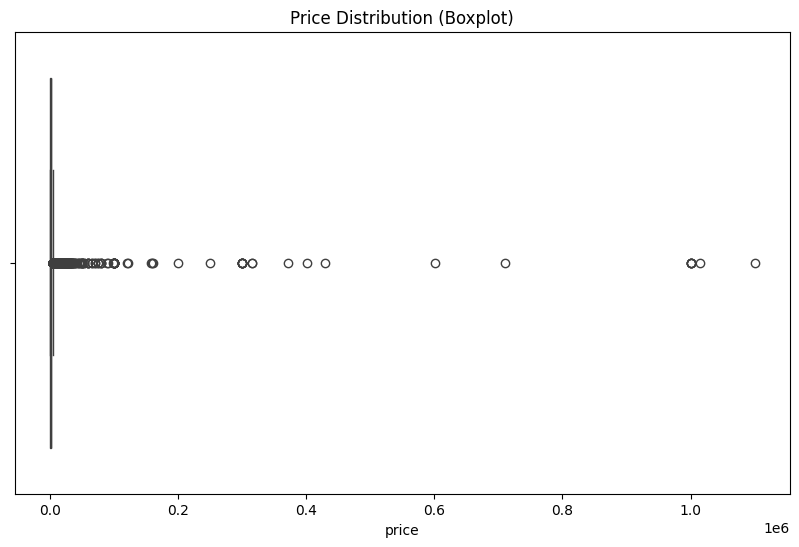

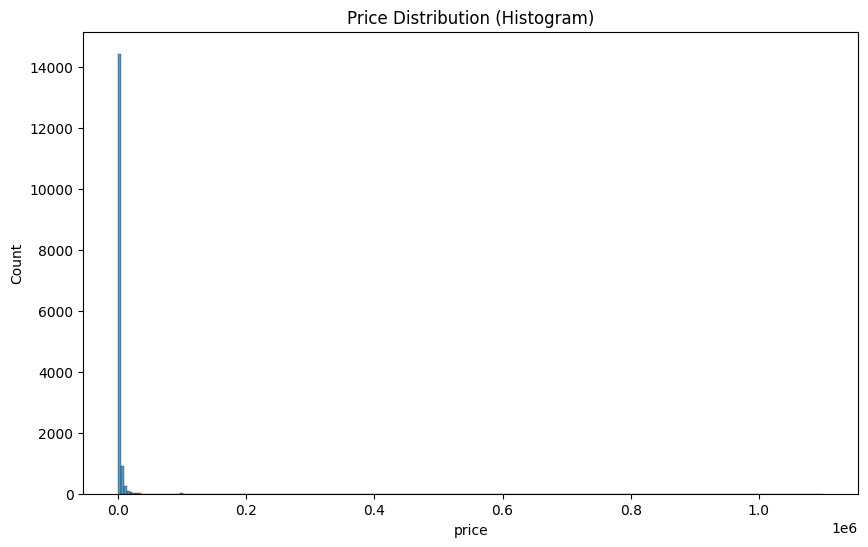

In [24]:
#PLOT INITIAL PRICE DISTRIBUTION
plt.figure(figsize=(10,6))
plt.title("Price Distribution (Boxplot)")
sns.boxplot(
    data=df,
    x="price"
    )

plt.figure(figsize=(10,6))
plt.title("Price Distribution (Histogram)")
sns.histplot(
    data=df,
    x="price"
    )

From the graphs above, we can see that the price distribution is **greatly** right-skewed. This is due to the presence extremely high-priced listings.

## Price Categories
Price is the variable with the widest range and extreme distribution in our data. Since the **main scope** of this project is Typical airbnb listings, we will be segmenting our listings based on price:

- **Normal**: Prices <= 7500 THB / night
- **Luxury**: Prices > 7500 THB / night

The amount **7500 THB** is chosen from the maximum amount on the price range on the Airbnb website while searching for listings in Bangkok using the Thailand Baht currency as of the writing of this notebook. It is also a good representative of the higher end listing prices without getting into the super-luxurious listings.

### Flagging Pricing Categories

In [25]:
#FLAG LUXURY LISTINGS
df["is_luxury"] = df['price'] > 7500
lux_amount = len(df[df["is_luxury"] == True])
print(f"{lux_amount} of Luxury listings found.")

673 of Luxury listings found.


## Descriptive Statistics for "minimum_nights"

### General Cleaning

In [26]:
#DROP minimum_nights THAT ARE ZERO (IF ANY)
min_nights_0 = df[df["minimum_nights"] == 0]
print(f"Amount of data with minimum_nights = 0 is: {len(price_0)}")

df = df[df["minimum_nights"] != 0]
print(f"{len(price_0)} data has been dropped.")

Amount of data with minimum_nights = 0 is: 1
1 data has been dropped.


Amount of data with minimum_nights = 0 is only 1, so we will just remove it.

In [27]:
df["minimum_nights"].describe(include="all")

count    15843.00000
mean        15.29988
std         50.83140
min          1.00000
25%          1.00000
50%          1.00000
75%          7.00000
max       1125.00000
Name: minimum_nights, dtype: float64

In [28]:
#LOWER/UPPER BOUND, OUTLIERS
minnights_q1 = df["minimum_nights"].quantile(0.25)
minnights_q2 = df["minimum_nights"].quantile(0.50)
minnights_q3 = df["minimum_nights"].quantile(0.75)

minnights_iqr = minnights_q3 - minnights_q1

minnights_lb = minnights_q1 - 1.5 * minnights_iqr
minnights_ub = minnights_q3 + 1.5 * minnights_iqr

print(f"Min nights IQR: {minnights_iqr}")
print(f"Min nights Lower Boundary: {minnights_lb}")
print(f"Min nights Upper Boundary: {minnights_ub}")

#MIN NIGHTS OUTLIERS
minnights_outliers = df[(df["minimum_nights"] > minnights_ub) | (df["minimum_nights"] < minnights_lb)]
print(f"Number of Min nights outliers: {len(minnights_outliers)}")

#MIN NIGHTS OUTLIERS FROM EACH "room_type"
noutlier_counts = df[df['minimum_nights'] > minnights_ub].groupby('room_type').size()
print()
print(noutlier_counts)

Min nights IQR: 6.0
Min nights Lower Boundary: -8.0
Min nights Upper Boundary: 16.0
Number of Min nights outliers: 3167

room_type
Entire home/apt    2517
Hotel room           14
Private room        629
Shared room           7
dtype: int64


### Plot Initial "minimum_nights" statistics

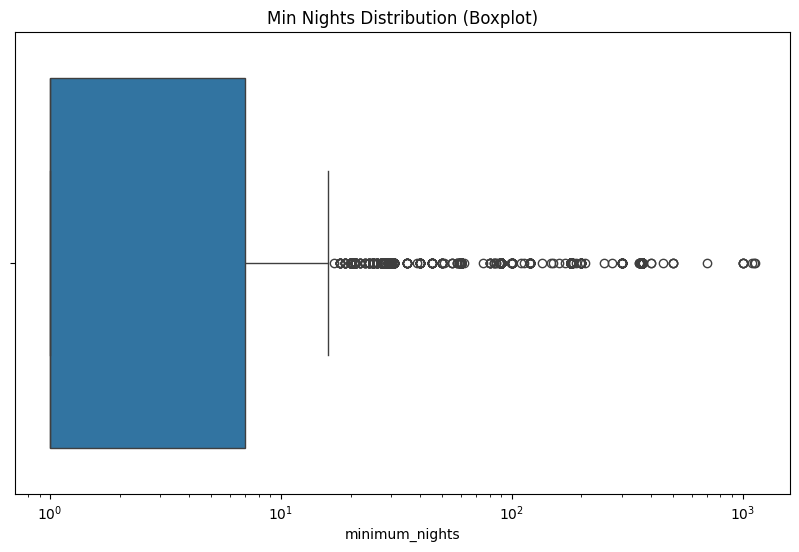

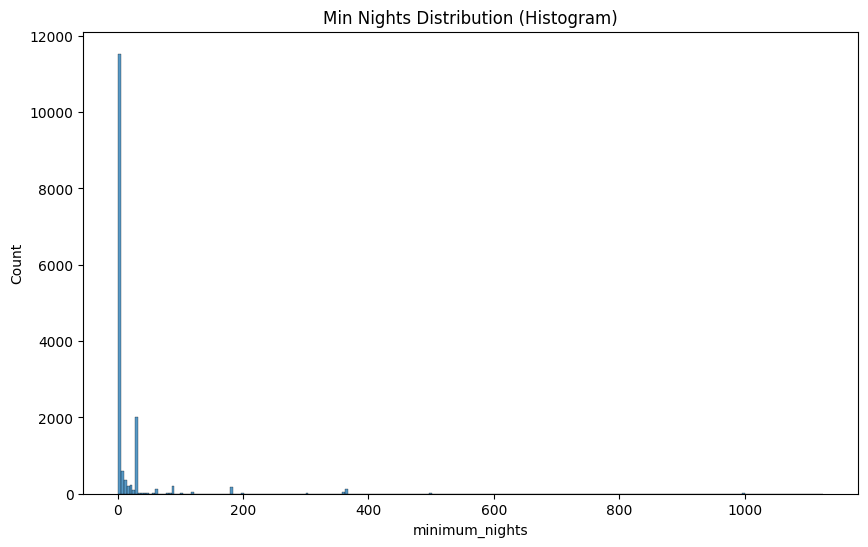

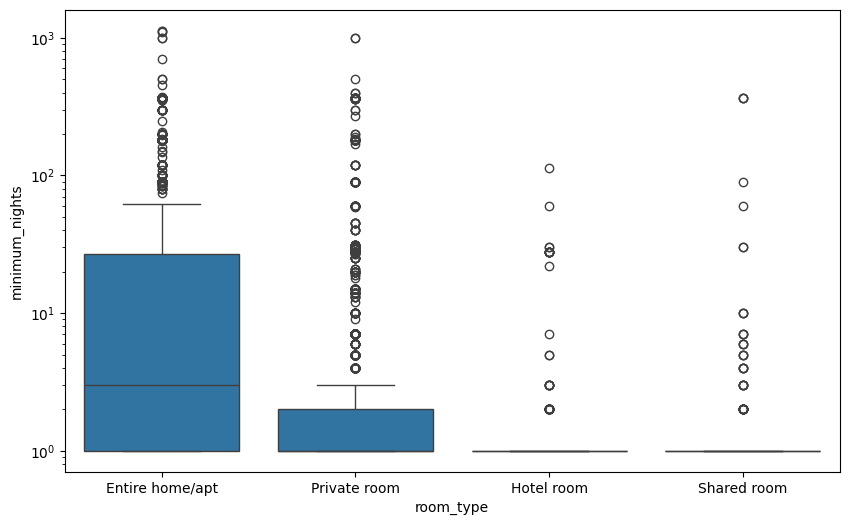

In [29]:
plt.figure(figsize=(10,6))
plt.title("Min Nights Distribution (Boxplot)")
sns.boxplot(
    data=df,
    x="minimum_nights"
    )
plt.xscale('log')  # To visualize large values
plt.show()

plt.figure(figsize=(10,6))
sns.histplot(
    data=df,
    x="minimum_nights"
)
plt.title("Min Nights Distribution (Histogram)")
plt.show()

plt.figure(figsize=(10,6))
sns.boxplot(
    data=df,
    x='room_type',
    y='minimum_nights'
    )
plt.yscale('log')
plt.show()


From the boxplot and minimum nights distribution above, we can see that minimum_nights is very right skewed. While most listings are under 30 days, some extend even more than 1000 days. Though statistically extreme, these are **actually possible** and have business reasoning behind it. We can also see that some hosts definitely prefer long term renting, especially on specific room types.

## Renting Term Categories
Once again, since the **main scope** of this project is Typical airbnb listings, we will be segmenting our renting terms based on minimum_nights:

- Short-term: minimum_nights <= 30 days
- Long-term: minimum_nights > 30 days

**30 days** is chosen as a threshold because Thailand local laws treat “short term” as under 30 days and longer as different legal category. Source: (https://kandiplaces.com/understanding-the-30-day-rental-law-in-the-thai-condo-act)

### Flagging Renting Term Categories

In [30]:
#FLAG LONG-TERM LISTINGS
df["is_long_term"] = df["minimum_nights"] > 30
long_term_amount = len(df[df["is_long_term"] == True])
print(f"{long_term_amount} of Long-term listings found.")

868 of Long-term listings found.


## Descriptive Statistics for "availability_365"
A ratio can be created for easier interpretation.

### General Cleaning

In [31]:
#REMOVE INVALID AVAILABILITY (less than 0 and more than 365) IF ANY
len_before = len(df)

invalid_availability = (df["availability_365"] < 0) | (df["availability_365"] > 365 )
df = df.drop(df[invalid_availability].index)

len_after = len(df)

print(f"{len_before - len_after} rows dropped")

0 rows dropped


In [32]:
df["availability_365"].describe()

count    15843.000000
mean       244.344947
std        125.835977
min          0.000000
25%        138.000000
50%        309.000000
75%        360.000000
max        365.000000
Name: availability_365, dtype: float64

No detailed statistics breakdown necessary, data structure is straight-forward.

### Plot Initial "availability_365" statistics

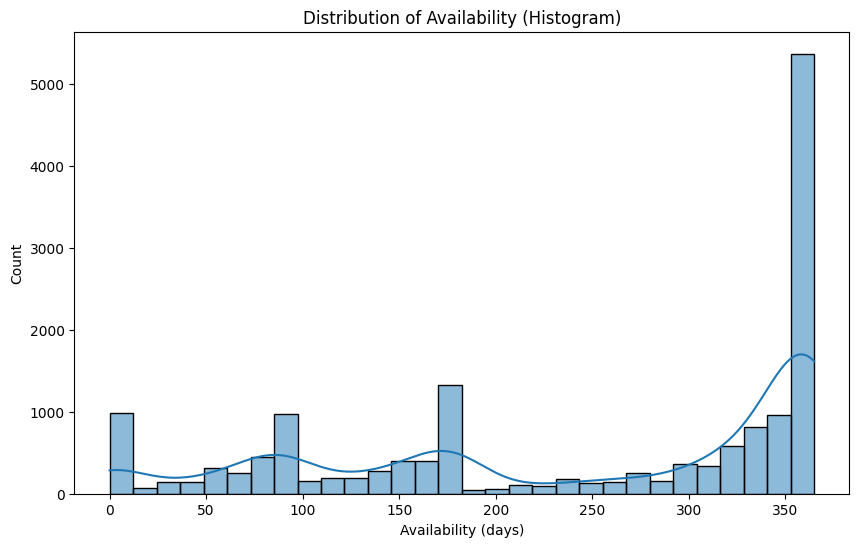

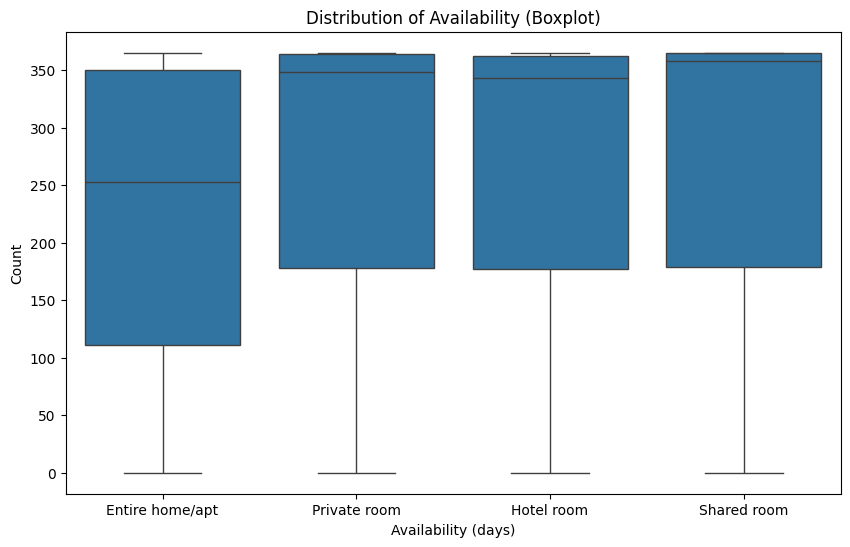

In [33]:
plt.figure(figsize=(10,6))
sns.histplot(
    data=df["availability_365"],
    bins=30,
    kde=True
    )
plt.title("Distribution of Availability (Histogram)")
plt.xlabel("Availability (days)")
plt.ylabel("Count")
plt.show()

plt.figure(figsize=(10,6))
sns.boxplot(
    x="room_type",
    y="availability_365",
    data=df
    )
plt.title("Distribution of Availability (Boxplot)")
plt.xlabel("Availability (days)")
plt.ylabel("Count")
plt.show()

0 availability could mean hosts blocked it all year. In conclusion, no data will be dropped because all value carry business meaning.

### Create "availability_ratio"

In [34]:
#CREATE AVAILABILITY RATIO COLUMN
df["availability_ratio"] = df["availability_365"] / 365
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15843 entries, 0 to 15853
Data columns (total 19 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              15843 non-null  float64       
 1   name                            15843 non-null  object        
 2   host_id                         15843 non-null  int64         
 3   host_name                       15843 non-null  object        
 4   neighbourhood                   15843 non-null  object        
 5   latitude                        15843 non-null  float64       
 6   longitude                       15843 non-null  float64       
 7   room_type                       15843 non-null  object        
 8   price                           15843 non-null  int64         
 9   minimum_nights                  15843 non-null  int64         
 10  number_of_reviews               15843 non-null  int64         
 11  last_re

## Handling "availability_ratio = 1"
It could mean that the listing is blocked by the host or was rented all year which is very Unlikely. Both will distort analysis. We will drop these rows.

In [ ]:
df = df[df["availability_365"] > 0]

##  Segment Data for the project

Now that we have the different flags, we can use this to segment our original data into three dataframes relevant to this project:

| ID | Segment | Conditions | Purpose |
|---|---|---|---|
| df_normal | Normal Listings | is_luxury = False & is_long_term = false | Represents core Airbnb market. Used on most of this project. |
| df_luxury | Luxury Listings | is_luxury = True | Represents any ultra-luxury renting. |
| df_longterm | Long-term Listings | is_long_term = True & is_luxury = False | Represents long-term rental patterns (monthly/expat/student stays) |

If needed, further cleaning will be done on each segments specifically.


In [35]:
#CREATE THE DIFFERENT DATAFRAMES
df_normal = df[(df['is_luxury'] == False) & (df['is_long_term'] == False)].copy()
df_luxury = df[df['is_luxury'] == True].copy()
df_longterm = df[(df['is_long_term'] == True) & (df['is_luxury'] == False)].copy()

print(f"Normal listings: {len(df_normal)}")
print(f"Luxury listings: {len(df_luxury)}")
print(f"Long-term listings: {len(df_longterm)}")

Normal listings: 14349
Luxury listings: 673
Long-term listings: 821


## Normal Listings (df_normal)
Since all necessary cleaning process has been done, and extreme prices no longer exist in this segment, No further cleaning is necessary.

In [36]:
#SHOW FIRST 5 ROWS
df_normal.head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,is_luxury,is_long_term,availability_ratio
0,27934.0,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0,False,False,0.967123
1,27979.0,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,NaT,0.00,2,358,0,False,False,0.980822
3,35780.0,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1,False,False,0.884932
4,941865.0,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,NaT,0.00,3,365,0,False,False,1.000000
6,48736.0,Condo with Chaopraya River View,222005,Athitaya,Rat Burana,13.68556,100.49535,Private room,1558,3,1,2014-02-03,0.01,1,365,0,False,False,1.000000


### Descriptive statistics for Normal listings "price"

In [37]:
#MIN, MAX, RANGE
Nprice_max = df_normal["price"].max()
Nprice_min = df_normal["price"].min()
Nprice_range = Nprice_max - Nprice_min

print(f"Minimum price for 'Normal' listings: {Nprice_min} Baht")
print(f"Maximum price for 'Normal' listings {Nprice_max} Baht")
print()

#MEAN, MEDIAN, STD
Nprice_mean = df_normal["price"].mean()
Nprice_median = df_normal["price"].median()
Nprice_std = df_normal["price"].std()

print(f"Mean price for 'Normal' listings: {Nprice_mean} Baht")
print(f"Median price for 'Normal' listings: {Nprice_median} Baht")
print()

#NORMALITY, SKEWNESS, ETC
Nprice_skew = df_normal["price"].skew()
Nprice_kurt = df_normal["price"].kurt()
statDP, p_valueDP = stats.normaltest(df_normal["price"])

print("Skewness for 'Normal' listings:", Nprice_skew) #If positive, right skewed
print("Kurtosis for 'Normal' listings:", Nprice_kurt) #If > 3, means very sharp peak
print("p-value D'Agostino Pearson for 'Normal' listings:", p_valueDP)
print()

#QUARTILE VALUES, LOWER/UPPER BOUND
Nprice_q1 = df_normal["price"].quantile(0.25)
Nprice_q2 = df_normal["price"].quantile(0.50)
Nprice_q3 = df_normal["price"].quantile(0.75)

print(f"Q1 for 'Normal' listings: {Nprice_q1} Baht")
print(f"Q2 for 'Normal' listings: {Nprice_q2} Baht")
print(f"Q3 for 'Normal' listings: {Nprice_q3} Baht")
print()

Nprice_iqr = Nprice_q3 - Nprice_q1

Nprice_lb = Nprice_q1 - 1.5 * Nprice_iqr
Nprice_ub = Nprice_q3 + 1.5 * Nprice_iqr

print(f"Price IQR for 'Normal' listings: {Nprice_iqr}")
print(f"Price Lower Boundary for 'Normal' listings: {Nprice_lb}")
print(f"Price Upper Boundary for 'Normal' listings: {Nprice_ub}")
print()

#PRICE OUTLIERS
Nprice_outliers = df_normal[(df_normal["price"] > Nprice_ub) | (df_normal["price"] < Nprice_lb)]
print(f"Number of 'Normal' listings price outliers: {len(Nprice_outliers)}")

#COMPARE WITH .describe()
df_normal.describe(include="all")

Minimum price for 'Normal' listings: 278 Baht
Maximum price for 'Normal' listings 7500 Baht

Mean price for 'Normal' listings: 1792.225520942226 Baht
Median price for 'Normal' listings: 1400.0 Baht

Skewness for 'Normal' listings: 1.7282170273895825
Kurtosis for 'Normal' listings: 3.1255231487742314
p-value D'Agostino Pearson for 'Normal' listings: 0.0

Q1 for 'Normal' listings: 900.0 Baht
Q2 for 'Normal' listings: 1400.0 Baht
Q3 for 'Normal' listings: 2220.0 Baht

Price IQR for 'Normal' listings: 1320.0
Price Lower Boundary for 'Normal' listings: -1080.0
Price Upper Boundary for 'Normal' listings: 4200.0

Number of 'Normal' listings price outliers: 914


,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,is_luxury,is_long_term,availability_ratio
count,1.434900e+04,14349,1.434900e+04,14349,14349,14349.000000,14349.000000,14349,14349.000000,14349.000000,14349.000000,9308,14349.000000,14349.000000,14349.000000,14349.000000,14349,14349,14349.000000
unique,NaN,13326,NaN,4868,50,NaN,NaN,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,NaN
top,NaN,New! La Chada Night Market studio 2PPL near MRT,NaN,Curry,Vadhana,NaN,NaN,Entire home/apt,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,NaN
freq,NaN,45,NaN,228,1905,NaN,NaN,7893,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14349,14349,NaN
mean,1.630548e+17,NaN,1.544035e+08,NaN,NaN,13.745701,100.559799,NaN,1792.225521,6.386159,17.389714,2021-09-26 11:27:39.991405312,0.546032,14.438149,241.852464,3.710015,NaN,NaN,0.662609
min,2.793400e+04,NaN,5.892000e+04,NaN,NaN,13.527300,100.329550,NaN,278.000000,1.000000,0.000000,2012-12-15 00:00:00,0.000000,1.000000,0.000000,0.000000,NaN,NaN,0.000000
25%,2.126740e+07,NaN,4.034325e+07,NaN,NaN,13.720330,100.529650,NaN,900.000000,1.000000,0.000000,2020-03-01 00:00:00,0.000000,1.000000,135.000000,0.000000,NaN,NaN,0.369863
50%,3.523692e+07,NaN,1.229567e+08,NaN,NaN,13.738990,100.561100,NaN,1400.000000,1.000000,2.000000,2022-11-01 00:00:00,0.110000,4.000000,305.000000,0.000000,NaN,NaN,0.835616
75%,5.327135e+07,NaN,2.382082e+08,NaN,NaN,13.759890,100.585130,NaN,2220.000000,5.000000,14.000000,2022-12-09 00:00:00,0.740000,14.000000,359.000000,3.000000,NaN,NaN,0.983562
max,7.907510e+17,NaN,4.926659e+08,NaN,NaN,13.953540,100.923440,NaN,7500.000000,30.000000,1224.000000,2022-12-28 00:00:00,19.130000,228.000000,365.000000,325.000000,NaN,NaN,1.000000


In [38]:
#CREATE LOG-TRANSFORMED PRICE
df_normal["log_price"] = np.log1p(df["price"])

Log transformed price can be used for statistical tests/linear regression if necessary.

### Plot "price" statistics for Normal Listings

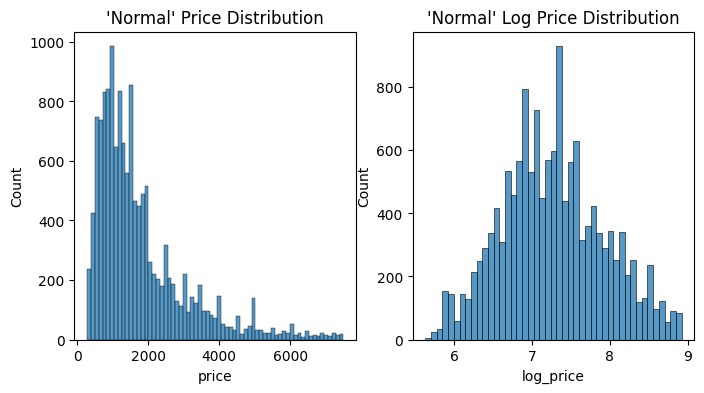

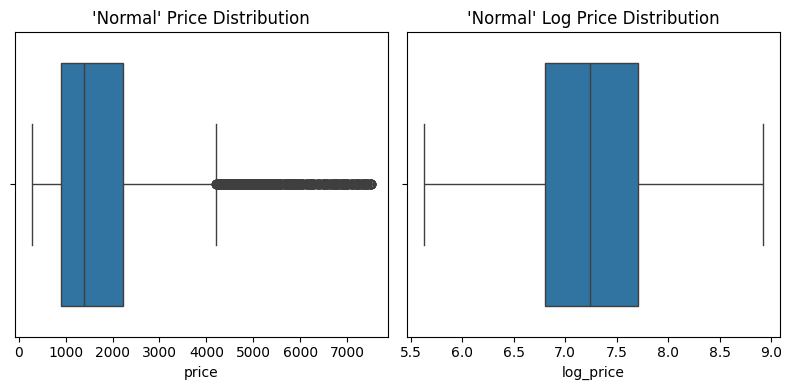

In [39]:
#HISTOGRAM PLOT
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
sns.histplot(
    data=df_normal,
    x="price"
)
plt.title("'Normal' Price Distribution")

plt.subplot(1,2,2)
sns.histplot(
    data=df_normal,
    x="log_price"
)
plt.title("'Normal' Log Price Distribution")

#BOXPLOT
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
sns.boxplot(
    data=df_normal,
    x="price"
)
plt.title("'Normal' Price Distribution")

plt.subplot(1,2,2)
sns.boxplot(
    data=df_normal,
    x="log_price"
)
plt.title("'Normal' Log Price Distribution")

plt.tight_layout()
plt.show()

## Luxury Listings (df_luxury)
Only **QUALITATIVE** analysis will be done on this segment, since Luxury listings "consists" of outliers and have no discernable patterns. This is the "market feature" of Luxury listsings.

In [40]:
#SHOW FIRST 5 ROWS
df_luxury.head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,is_luxury,is_long_term,availability_ratio
17,66046.0,"24Flr- 1br Apt near JJ, MRT, BTS",323158,Sue,Chatuchak,13.82298,100.56484,Entire home/apt,122594,2,9,2020-03-04,0.09,6,180,0,True,False,0.493151
48,185364.0,Beautiful Wood Bangkok Resort House,889670,Narumon,Nong Chok,13.77900,100.83671,Entire home/apt,8658,1,0,NaT,0.00,1,363,0,True,False,0.994521
154,1323380.0,Master Suite in Pool Villa,2975807,Ingo,Vadhana,13.74618,100.55168,Private room,9600,28,1,2017-06-19,0.01,2,365,0,True,False,1.000000
190,854660.0,Nostalgic Thai House - The Villa,931710,Jeremy,Nong Chok,13.77672,100.83851,Entire home/apt,8658,1,1,2015-09-03,0.01,2,365,0,True,False,1.000000
193,858311.0,"River view penthouse 30 Fl, 5 Pers, taxi included",4491588,Donald,Khlong San,13.72135,100.50800,Entire home/apt,7929,2,256,2022-12-15,2.13,1,267,43,True,False,0.731507


### Descriptive statistics for Luxury listing "price" (!!JUST FORVISUALIZATION!!)

In [41]:
#MIN, MAX, RANGE
Lprice_max = df_luxury["price"].max()
Lprice_min = df_luxury["price"].min()
Lprice_range = Lprice_max - Lprice_min

print(f"Minimum price for 'Luxury' listings: {Lprice_min} Baht")
print(f"Maximum price for 'Luxury' listings: {Lprice_max} Baht")
print()

#MEAN, MEDIAN, STD
Lprice_mean = df_luxury["price"].mean()
Lprice_median = df_luxury["price"].median()
Lprice_std = df_luxury["price"].std()

print(f"Mean price for 'Luxury' listings: {Lprice_mean} Baht")
print(f"Median price for 'Luxury' listings: {Lprice_median} Baht")
print()

#NORMALITY, SKEWNESS, ETC
Lprice_skew = df_luxury["price"].skew()
Lprice_kurt = df_luxury["price"].kurt()
statDP, p_valueDP = stats.normaltest(df_luxury["price"])

print("Skewness for 'Luxury' listings:", Lprice_skew) #If positive, right skewed
print("Kurtosis for 'Luxury' listings:", Lprice_kurt) #If > 3, means very sharp peak
print("p-value D'Agostino Pearson for 'Luxury' listings:", p_valueDP)
print()

#QUARTILE VALUES, LOWER/UPPER BOUND
Lprice_q1 = df_luxury["price"].quantile(0.25)
Lprice_q2 = df_luxury["price"].quantile(0.50)
Lprice_q3 = df_luxury["price"].quantile(0.75)

print(f"Q1 for 'Luxury' listings: {Lprice_q1} Baht")
print(f"Q2 for 'Luxury' listings: {Lprice_q2} Baht")
print(f"Q3 for 'Luxury' listings: {Lprice_q3} Baht")
print()

Lprice_iqr = Lprice_q3 - Lprice_q1

Lprice_lb = Lprice_q1 - 1.5 * Lprice_iqr
Lprice_ub = Lprice_q3 + 1.5 * Lprice_iqr

print(f"Price IQR for 'Luxury' listings: {Lprice_iqr}")
print(f"Price Lower Boundary for 'Luxury' listings: {Lprice_lb}")
print(f"Price Upper Boundary for 'Luxury' listings: {Lprice_ub}")
print()

#PRICE OUTLIERS
Lprice_outliers = df_luxury[(df_luxury["price"] > Lprice_ub) | (df_luxury["price"] < Lprice_lb)]
print(f"Number of 'Luxury' listings price outliers: {len(Lprice_outliers)}")

#COMPARE WITH .describe()
df_luxury.describe(include="all")

Minimum price for 'Luxury' listings: 7504 Baht
Maximum price for 'Luxury' listings: 1100000 Baht

Mean price for 'Luxury' listings: 35980.75334323923 Baht
Median price for 'Luxury' listings: 11128.0 Baht

Skewness for 'Luxury' listings: 7.044695859984715
Kurtosis for 'Luxury' listings: 53.664324198768746
p-value D'Agostino Pearson for 'Luxury' listings: 4.62935954074405e-193

Q1 for 'Luxury' listings: 9000.0 Baht
Q2 for 'Luxury' listings: 11128.0 Baht
Q3 for 'Luxury' listings: 17662.0 Baht

Price IQR for 'Luxury' listings: 8662.0
Price Lower Boundary for 'Luxury' listings: -3993.0
Price Upper Boundary for 'Luxury' listings: 30655.0

Number of 'Luxury' listings price outliers: 85


,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,is_luxury,is_long_term,availability_ratio
count,6.730000e+02,673,6.730000e+02,673,673,673.000000,673.000000,673,6.730000e+02,673.000000,673.000000,331,673.000000,673.000000,673.000000,673.000000,673,673,673.000000
unique,NaN,638,NaN,368,47,NaN,NaN,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,2,NaN
top,NaN,Luxury 3 Bedrooms Suite @BTS Phrompong,NaN,Krittika,Vadhana,NaN,NaN,Entire home/apt,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,False,NaN
freq,NaN,5,NaN,20,155,NaN,NaN,372,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,673,626,NaN
mean,1.326475e+17,NaN,1.725594e+08,NaN,NaN,13.739794,100.560585,NaN,3.598075e+04,23.141159,10.552749,2021-04-08 17:37:09.607250688,0.299465,9.536404,262.199108,2.390788,NaN,NaN,0.718354
min,6.604600e+04,NaN,2.185620e+05,NaN,NaN,13.605310,100.378990,NaN,7.504000e+03,1.000000,0.000000,2014-11-20 00:00:00,0.000000,1.000000,0.000000,0.000000,NaN,NaN,0.000000
25%,2.324147e+07,NaN,4.541424e+07,NaN,NaN,13.721715,100.533690,NaN,9.000000e+03,1.000000,0.000000,2020-01-01 00:00:00,0.000000,1.000000,173.000000,0.000000,NaN,NaN,0.473973
50%,3.504360e+07,NaN,1.635149e+08,NaN,NaN,13.735340,100.562180,NaN,1.112800e+04,1.000000,0.000000,2022-07-02 00:00:00,0.000000,4.000000,345.000000,0.000000,NaN,NaN,0.945205
75%,4.684313e+07,NaN,2.657302e+08,NaN,NaN,13.748880,100.582320,NaN,1.766200e+04,2.000000,7.000000,2022-12-05 00:00:00,0.330000,10.000000,364.000000,1.000000,NaN,NaN,0.997260
max,7.908160e+17,NaN,4.912487e+08,NaN,NaN,13.950740,100.838510,NaN,1.100000e+06,999.000000,344.000000,2022-12-28 00:00:00,6.000000,89.000000,365.000000,80.000000,NaN,NaN,1.000000


In [42]:
#CREATE LOG-TRANSFORMED PRICE
df_luxury["log_price"] = np.log1p(df["price"])

### Plot "price" statistics for Luxury listings (!!JUST FORVISUALIZATION!!)

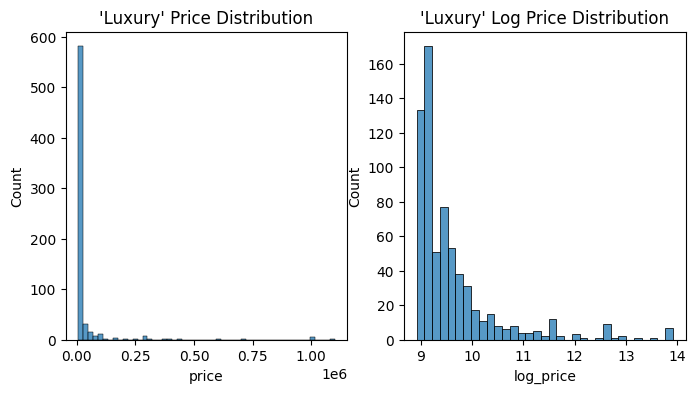

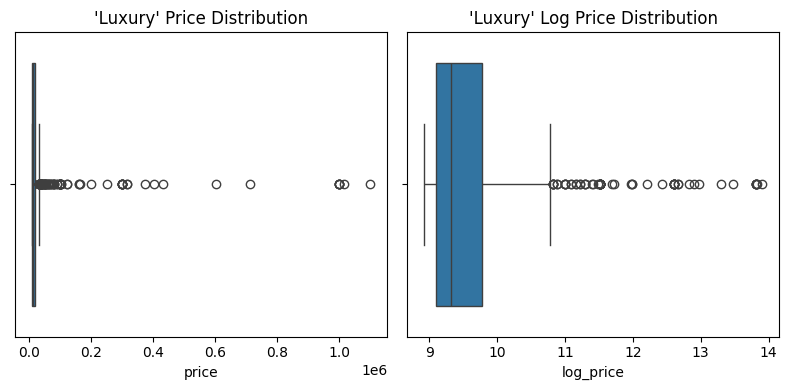

In [43]:
#HISTOGRAM PLOT
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
sns.histplot(
    data=df_luxury,
    x="price"
)
plt.title("'Luxury' Price Distribution")

plt.subplot(1,2,2)
sns.histplot(
    data=df_luxury,
    x="log_price"
)
plt.title("'Luxury' Log Price Distribution")

#BOXPLOT
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
sns.boxplot(
    data=df_luxury,
    x="price"
)
plt.title("'Luxury' Price Distribution")

plt.subplot(1,2,2)
sns.boxplot(
    data=df_luxury,
    x="log_price"
)
plt.title("'Luxury' Log Price Distribution")

plt.tight_layout()
plt.show()

## Long-term Listings (df_longterm)

In [44]:
#SHOW FIRST 5 ROWS
df_longterm.head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,is_luxury,is_long_term,availability_ratio
2,28745.0,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,NaT,0.00,1,365,0,False,True,1.000000
5,1704776.0,NEw Pro!! Bungalow Bkk Centre,2129668,Wimonpak,Bang Kho Laem,13.69757,100.52880,Entire home/apt,1000,250,19,2017-08-03,0.17,41,365,0,False,True,1.000000
23,1808600.0,Contemporary Modern Duplex-Thong Lo,9478184,Shine,Khlong Toei,13.72097,100.57823,Entire home/apt,2078,60,83,2018-09-12,0.75,1,55,0,False,True,0.150685
38,1842066.0,ICONSIAM River view on 49th floor,9626074,Weera,Bang Rak,13.72287,100.51678,Private room,2500,180,15,2015-12-08,0.14,1,88,0,False,True,0.241096
39,169514.0,2br apt in Sukhumvit Asoke near BTS,729617,Kanchuya,Vadhana,13.74464,100.55784,Entire home/apt,1732,90,0,NaT,0.00,1,365,0,False,True,1.000000


### Descriptive statistics for Long-term listings "price"

In [45]:
#MIN, MAX, RANGE
Lprice_max = df_longterm["price"].max()
Lprice_min = df_longterm["price"].min()
Lprice_range = Lprice_max - Lprice_min

print(f"Minimum price for 'Normal' listings: {Lprice_min} Baht")
print(f"Maximum price for 'Normal' listings {Lprice_max} Baht")
print()

#MEAN, MEDIAN, STD
Lprice_mean = df_longterm["price"].mean()
Lprice_median = df_longterm["price"].median()
Lprice_std = df_longterm["price"].std()

print(f"Mean price for 'Normal' listings: {Lprice_mean} Baht")
print(f"Median price for 'Normal' listings: {Lprice_median} Baht")
print()

#NORMALITY, SKEWNESS, ETC
Lprice_skew = df_longterm["price"].skew()
Lprice_kurt = df_longterm["price"].kurt()
statDP, p_valueDP = stats.normaltest(df_longterm["price"])

print("Skewness for 'Normal' listings:", Lprice_skew) #If positive, right skewed
print("Kurtosis for 'Normal' listings:", Lprice_kurt) #If > 3, means very sharp peak
print("p-value D'Agostino Pearson for 'Normal' listings:", p_valueDP)
print()

#QUARTILE VALUES, LOWER/UPPER BOUND
Lprice_q1 = df_longterm["price"].quantile(0.25)
Lprice_q2 = df_longterm["price"].quantile(0.50)
Lprice_q3 = df_longterm["price"].quantile(0.75)

print(f"Q1 for 'Normal' listings: {Lprice_q1} Baht")
print(f"Q2 for 'Normal' listings: {Lprice_q2} Baht")
print(f"Q3 for 'Normal' listings: {Lprice_q3} Baht")
print()

Lprice_iqr = Lprice_q3 - Lprice_q1

Lprice_lb = Lprice_q1 - 1.5 * Lprice_iqr
Lprice_ub = Lprice_q3 + 1.5 * Lprice_iqr

print(f"Price IQR for 'Normal' listings: {Lprice_iqr}")
print(f"Price Lower Boundary for 'Normal' listings: {Lprice_lb}")
print(f"Price Upper Boundary for 'Normal' listings: {Lprice_ub}")
print()

#PRICE OUTLIERS
Lprice_outliers = df_longterm[(df_longterm["price"] > Lprice_ub) | (df_longterm["price"] < Lprice_lb)]
print(f"Number of 'Normal' listings price outliers: {len(Lprice_outliers)}")

#COMPARE WITH .describe()
df_longterm.describe(include="all")

Minimum price for 'Normal' listings: 305 Baht
Maximum price for 'Normal' listings 7286 Baht

Mean price for 'Normal' listings: 1298.0560292326431 Baht
Median price for 'Normal' listings: 1000.0 Baht

Skewness for 'Normal' listings: 2.3057300808378915
Kurtosis for 'Normal' listings: 7.589445235004838
p-value D'Agostino Pearson for 'Normal' listings: 2.3969078671719962e-92

Q1 for 'Normal' listings: 717.0 Baht
Q2 for 'Normal' listings: 1000.0 Baht
Q3 for 'Normal' listings: 1520.0 Baht

Price IQR for 'Normal' listings: 803.0
Price Lower Boundary for 'Normal' listings: -487.5
Price Upper Boundary for 'Normal' listings: 2724.5

Number of 'Normal' listings price outliers: 58


,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,is_luxury,is_long_term,availability_ratio
count,8.210000e+02,821,8.210000e+02,821,821,821.000000,821.000000,821,821.000000,821.000000,821.000000,421,821.000000,821.000000,821.000000,821.000000,821,821,821.000000
unique,NaN,817,NaN,515,41,NaN,NaN,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,NaN
top,NaN,The Tree Interchange (river view),NaN,George,Khlong Toei,NaN,NaN,Entire home/apt,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,True,NaN
freq,NaN,2,NaN,38,109,NaN,NaN,645,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,821,821,NaN
mean,9.138914e+16,NaN,1.346503e+08,NaN,NaN,13.739919,100.560956,NaN,1298.056029,164.661389,9.002436,2020-05-10 22:37:54.584323072,0.178611,7.975639,273.271620,0.427527,NaN,NaN,0.748689
min,2.874500e+04,NaN,1.237840e+05,NaN,NaN,13.633610,100.382973,NaN,305.000000,31.000000,0.000000,2013-06-28 00:00:00,0.000000,1.000000,0.000000,0.000000,NaN,NaN,0.000000
25%,1.453961e+07,NaN,2.763032e+07,NaN,NaN,13.713060,100.528020,NaN,717.000000,85.000000,0.000000,2019-02-15 00:00:00,0.000000,1.000000,179.000000,0.000000,NaN,NaN,0.490411
50%,3.203179e+07,NaN,8.681723e+07,NaN,NaN,13.730650,100.563950,NaN,1000.000000,100.000000,1.000000,2020-02-26 00:00:00,0.010000,2.000000,358.000000,0.000000,NaN,NaN,0.980822
75%,4.302100e+07,NaN,2.252014e+08,NaN,NaN,13.755840,100.590300,NaN,1520.000000,180.000000,5.000000,2022-07-30 00:00:00,0.180000,8.000000,365.000000,0.000000,NaN,NaN,1.000000
max,7.875800e+17,NaN,4.919786e+08,NaN,NaN,13.933050,100.753990,NaN,7286.000000,1125.000000,295.000000,2022-12-24 00:00:00,3.120000,48.000000,365.000000,20.000000,NaN,NaN,1.000000


In [46]:
#CREATE LOG-TRANSFORMED PRICE
df_longterm["log_price"] = np.log1p(df["price"])

### Plot "price" statistics for Long-term listings

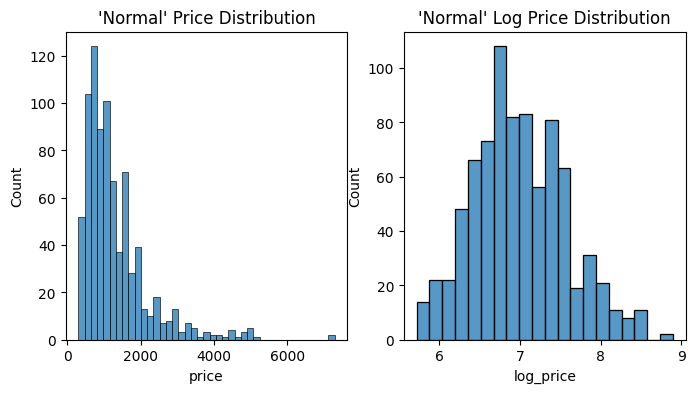

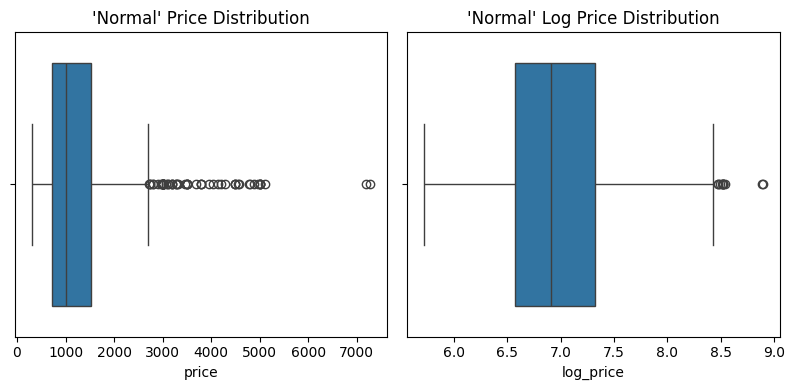

In [47]:
#HISTOGRAM PLOT
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
sns.histplot(
    data=df_longterm,
    x="price"
)
plt.title("'Normal' Price Distribution")

plt.subplot(1,2,2)
sns.histplot(
    data=df_longterm,
    x="log_price"
)
plt.title("'Normal' Log Price Distribution")

#BOXPLOT
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
sns.boxplot(
    data=df_longterm,
    x="price"
)
plt.title("'Normal' Price Distribution")

plt.subplot(1,2,2)
sns.boxplot(
    data=df_longterm,
    x="log_price"
)
plt.title("'Normal' Log Price Distribution")

plt.tight_layout()
plt.show()

### 1st and 99th Percentile Long-term listing "price"
We will use this to drop the extreme prices above the 99th percentile.

In [48]:
Lprice_p1 = df_longterm["price"].quantile(0.01)
Lprice_p99 = df_longterm["price"].quantile(0.99)
print(f"1st percentile: {Lprice_p1:.2f}, 99th percentile: {Lprice_p99:.2f}")

above_99 = (df_longterm["price"] > Lprice_p99).sum()
print(f"Listings above 99th percentile: {above_99}")

1st percentile: 350.00, 99th percentile: 4874.40
Listings above 99th percentile: 9


There are 9 listings above the 99th percentile, which is ~1.1% of the data. We will **drop these rows**.

In [49]:
df_longterm = df_longterm[df_longterm["price"] <= Lprice_p99].copy()

### Plot "price" statistics for Long-term listings after cleaning

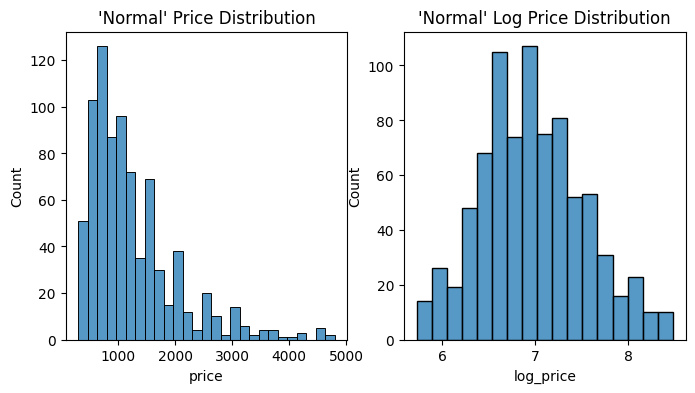

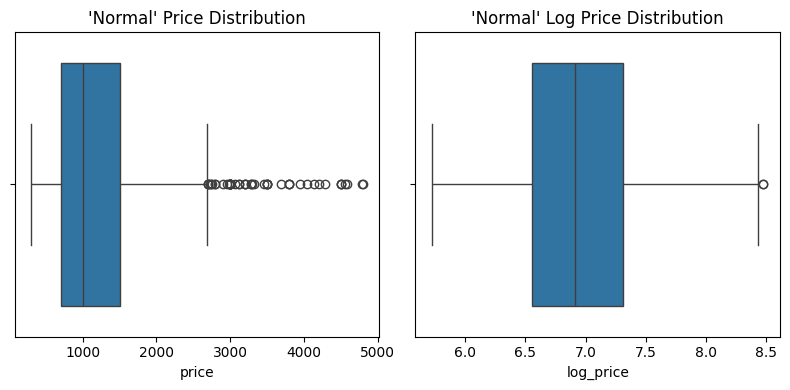

In [50]:
#HISTOGRAM PLOT
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
sns.histplot(
    data=df_longterm,
    x="price"
)
plt.title("'Normal' Price Distribution")

plt.subplot(1,2,2)
sns.histplot(
    data=df_longterm,
    x="log_price"
)
plt.title("'Normal' Log Price Distribution")

#BOXPLOT
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
sns.boxplot(
    data=df_longterm,
    x="price"
)
plt.title("'Normal' Price Distribution")

plt.subplot(1,2,2)
sns.boxplot(
    data=df_longterm,
    x="log_price"
)
plt.title("'Normal' Log Price Distribution")

plt.tight_layout()
plt.show()

In [51]:
df_normal.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14349 entries, 0 to 15853
Data columns (total 20 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              14349 non-null  float64       
 1   name                            14349 non-null  object        
 2   host_id                         14349 non-null  int64         
 3   host_name                       14349 non-null  object        
 4   neighbourhood                   14349 non-null  object        
 5   latitude                        14349 non-null  float64       
 6   longitude                       14349 non-null  float64       
 7   room_type                       14349 non-null  object        
 8   price                           14349 non-null  int64         
 9   minimum_nights                  14349 non-null  int64         
 10  number_of_reviews               14349 non-null  int64         
 11  last_re

## Export each segments into separate CSV's
All cleaning and segmentation done. Export into different CSV for easier EDA.

In [52]:
df_normal.head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,is_luxury,is_long_term,availability_ratio,log_price
0,27934.0,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0,False,False,0.967123,7.552762
1,27979.0,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,NaT,0.00,2,358,0,False,False,0.980822,7.183112
3,35780.0,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1,False,False,0.884932,7.160069
4,941865.0,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,NaT,0.00,3,365,0,False,False,1.000000,7.552762
6,48736.0,Condo with Chaopraya River View,222005,Athitaya,Rat Burana,13.68556,100.49535,Private room,1558,3,1,2014-02-03,0.01,1,365,0,False,False,1.000000,7.351800


In [53]:
df_luxury.head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,is_luxury,is_long_term,availability_ratio,log_price
17,66046.0,"24Flr- 1br Apt near JJ, MRT, BTS",323158,Sue,Chatuchak,13.82298,100.56484,Entire home/apt,122594,2,9,2020-03-04,0.09,6,180,0,True,False,0.493151,11.716642
48,185364.0,Beautiful Wood Bangkok Resort House,889670,Narumon,Nong Chok,13.77900,100.83671,Entire home/apt,8658,1,0,NaT,0.00,1,363,0,True,False,0.994521,9.066355
154,1323380.0,Master Suite in Pool Villa,2975807,Ingo,Vadhana,13.74618,100.55168,Private room,9600,28,1,2017-06-19,0.01,2,365,0,True,False,1.000000,9.169623
190,854660.0,Nostalgic Thai House - The Villa,931710,Jeremy,Nong Chok,13.77672,100.83851,Entire home/apt,8658,1,1,2015-09-03,0.01,2,365,0,True,False,1.000000,9.066355
193,858311.0,"River view penthouse 30 Fl, 5 Pers, taxi included",4491588,Donald,Khlong San,13.72135,100.50800,Entire home/apt,7929,2,256,2022-12-15,2.13,1,267,43,True,False,0.731507,8.978408


In [54]:
df_longterm.head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,is_luxury,is_long_term,availability_ratio,log_price
2,28745.0,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,NaT,0.00,1,365,0,False,True,1.000000,6.685861
5,1704776.0,NEw Pro!! Bungalow Bkk Centre,2129668,Wimonpak,Bang Kho Laem,13.69757,100.52880,Entire home/apt,1000,250,19,2017-08-03,0.17,41,365,0,False,True,1.000000,6.908755
23,1808600.0,Contemporary Modern Duplex-Thong Lo,9478184,Shine,Khlong Toei,13.72097,100.57823,Entire home/apt,2078,60,83,2018-09-12,0.75,1,55,0,False,True,0.150685,7.639642
38,1842066.0,ICONSIAM River view on 49th floor,9626074,Weera,Bang Rak,13.72287,100.51678,Private room,2500,180,15,2015-12-08,0.14,1,88,0,False,True,0.241096,7.824446
39,169514.0,2br apt in Sukhumvit Asoke near BTS,729617,Kanchuya,Vadhana,13.74464,100.55784,Entire home/apt,1732,90,0,NaT,0.00,1,365,0,False,True,1.000000,7.457609


In [55]:
df_normal.to_csv("df_normal_cleaned.csv", index=False)
df_luxury.to_csv("df_luxury_cleaned.csv", index=False)
df_longterm.to_csv("df_longterm_cleaned.csv", index=False)

3 dataframes exported and **ready for analysis.**